In [ ]:
%pip install transformers
%pip install timm

In [2]:
import random
from io import BytesIO
from typing import (
    Collection,
    Literal,
    Mapping,
    Sequence,
    TypedDict,
    cast,
)

import requests
import torch
from IPython.display import display  # type: ignore
from PIL import Image, ImageDraw, ImageFont
from transformers import (
    BatchFeature,
    ConditionalDetrImageProcessor,
    ConditionalDetrForObjectDetection,
)


### Constants

Here we define a few constants that we will use, including the Huggingface model name

We also specify the `DEVICE_TO_USE` to run the model. If you have an NVIDIA GPU, you can change to `"cuda"`.


In [3]:
MODEL = "yainage90/fashion-object-detection"

DEVICE_TO_USE: Literal["cpu", "cuda", "mps"] = "cpu"

### Load the model


In [4]:
image_processor = ConditionalDetrImageProcessor.from_pretrained(
    pretrained_model_name_or_path=MODEL
)
model = ConditionalDetrForObjectDetection.from_pretrained(
    pretrained_model_name_or_path=MODEL
).eval()


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

### Fetch images for input


In [5]:
def get_images_from_urls(
    image_urls: list[str], long_edge_size: int | None = 1000
) -> Sequence[Image.Image]:
    def download_file(url: str) -> BytesIO:
        response = requests.get(url)
        response.raise_for_status()  # Ensure we notice bad responses
        return BytesIO(response.content)

    def resize_long_edge(
        image: Image.Image,
        long_edge_size: int,
    ) -> Image.Image:
        width, height = image.size
        if width > height:
            return image.resize((long_edge_size, int(height * long_edge_size / width)))
        else:
            return image.resize((int(width * long_edge_size / height), long_edge_size))

    images = [
        Image.open(download_file(image_url)).convert(mode="RGB")
        for image_url in image_urls
    ]

    if long_edge_size is not None:
        images = [resize_long_edge(image, long_edge_size) for image in images]

    return images


def get_input_for_inference(
    image_processor: ConditionalDetrImageProcessor,
    pil_images: Collection[Image.Image],
) -> BatchFeature:
    """
    This function takes a list of PIL images and returns the transformed images and the reverse transform.
    """
    return image_processor.preprocess(images=list(pil_images), return_tensors="pt")

In [6]:
IMAGE_URLS = [
    "https://raw.githubusercontent.com/valentinafeve/fine_tunning_YOLOS_for_fashion/main/image.jpg",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/demo-images/fashion/full-size/0.webp",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/demo-images/fashion/full-size/1.webp",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/sample_images/fashion/dock_shorts.webp",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/sample_images/fashion/skater_skirt.jpg",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/sample_images/animals/petting_zoo.jpeg",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/sample_images/vehicles_and_transportation/5.jpg",
    "https://dragoneye-public.s3.us-east-1.amazonaws.com/sample_images/sports_equipment/8.jpg",
]

input_images = get_images_from_urls(IMAGE_URLS)
input_features = get_input_for_inference(
    image_processor=image_processor, pil_images=input_images
).to(DEVICE_TO_USE)

### Run the images through the model


In [7]:
class ModelResult(TypedDict):
    scores: torch.Tensor
    labels: torch.Tensor
    boxes: torch.Tensor


with torch.no_grad():
    outputs = model(**input_features)
    model_results = cast(
        list[ModelResult],
        image_processor.post_process_object_detection(
            outputs=outputs,
            target_sizes=[
                (input_image.height, input_image.width) for input_image in input_images
            ],
        ),
    )


In [8]:
for idx, model_result in enumerate(model_results):
    print(f"Model Result - Image {idx} - {IMAGE_URLS[idx]}")
    print(f"{model_result}\n")

Model Result - Image 0 - https://raw.githubusercontent.com/valentinafeve/fine_tunning_YOLOS_for_fashion/main/image.jpg
{'scores': tensor([0.8621, 0.8531, 0.6962, 0.6684, 0.6593]), 'labels': tensor([5, 5, 1, 4, 1]), 'boxes': tensor([[343.8694, 792.8584, 450.2186, 956.7753],
        [170.8194, 764.6183, 263.7748, 926.9708],
        [392.7684, 544.4955, 503.0385, 816.2642],
        [193.7695, 166.7957, 601.5334, 594.6818],
        [226.1598, 540.5020, 403.0605, 782.2097]])}

Model Result - Image 1 - https://dragoneye-public.s3.us-east-1.amazonaws.com/demo-images/fashion/full-size/0.webp
{'scores': tensor([0.6750, 0.5207]), 'labels': tensor([2, 1]), 'boxes': tensor([[-4.3758e-01,  2.0678e+02,  6.3911e+02,  9.3511e+02],
        [ 6.0376e+01,  8.8120e+02,  2.2631e+02,  9.9856e+02]])}

Model Result - Image 2 - https://dragoneye-public.s3.us-east-1.amazonaws.com/demo-images/fashion/full-size/1.webp
{'scores': tensor([0.9612, 0.9550, 0.9423, 0.6554, 0.5867]), 'labels': tensor([5, 5, 1, 6, 4]), 

### Visualize the object prediction results


In [9]:
def visualize_object_predictions(
    img: Image.Image,
    model_result: ModelResult,
    class_id_to_label: Mapping[int, str] | Sequence[str] | None,
    display_result: bool,
) -> Image.Image | None:
    img = img.copy()
    label_size = img.size[1] / 30
    draw = ImageDraw.Draw(img, "RGBA")

    font = ImageFont.load_default(int(label_size))

    for bbox, score, class_id in zip(
        model_result["boxes"],
        model_result["scores"],
        model_result["labels"],
    ):
        bbox = tuple(bbox.numpy(force=True))  # pyright: ignore [reportUnknownArgumentType]
        class_id = int(class_id)
        score = float(score)

        random.seed(class_id)
        color = (
            random.randint(0, 200),
            random.randint(0, 200),
            random.randint(0, 200),
        )

        draw.rounded_rectangle(bbox, outline=(*color, 200), radius=5, width=2)
        draw.rounded_rectangle(bbox, fill=(*color, 100), radius=5)

        class_text = class_id_to_label[class_id] if class_id_to_label else class_id
        label_text = f"{class_text} - {score: .0%}"

        text_bbox = font.getbbox(label_text)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = (text_bbox[3] - text_bbox[1]) * 1.5

        x_min, y_min, _x_max, _y_max = bbox

        text_background = [
            (x_min, y_min),
            (x_min + text_width, y_min + text_height),
        ]
        draw.rounded_rectangle(text_background, fill=(*color, 175), radius=2)
        draw.text(
            (x_min, y_min),
            label_text,
            fill="white",
            font=font,
        )

    if display_result:
        display(img)
    else:
        return img


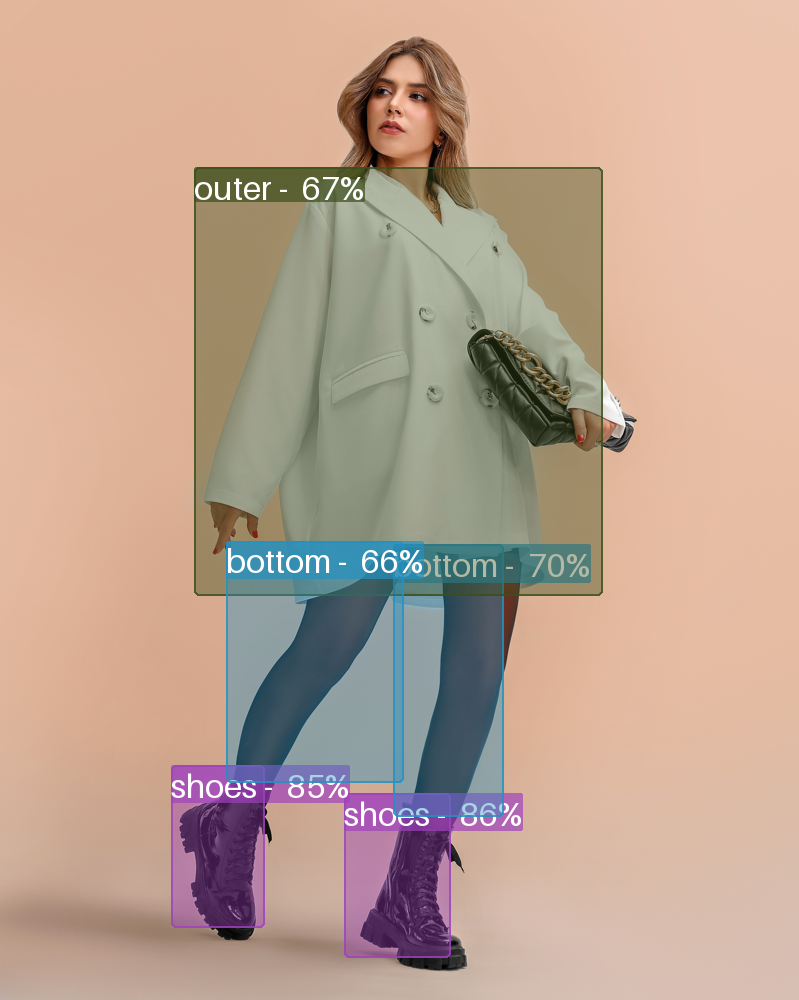

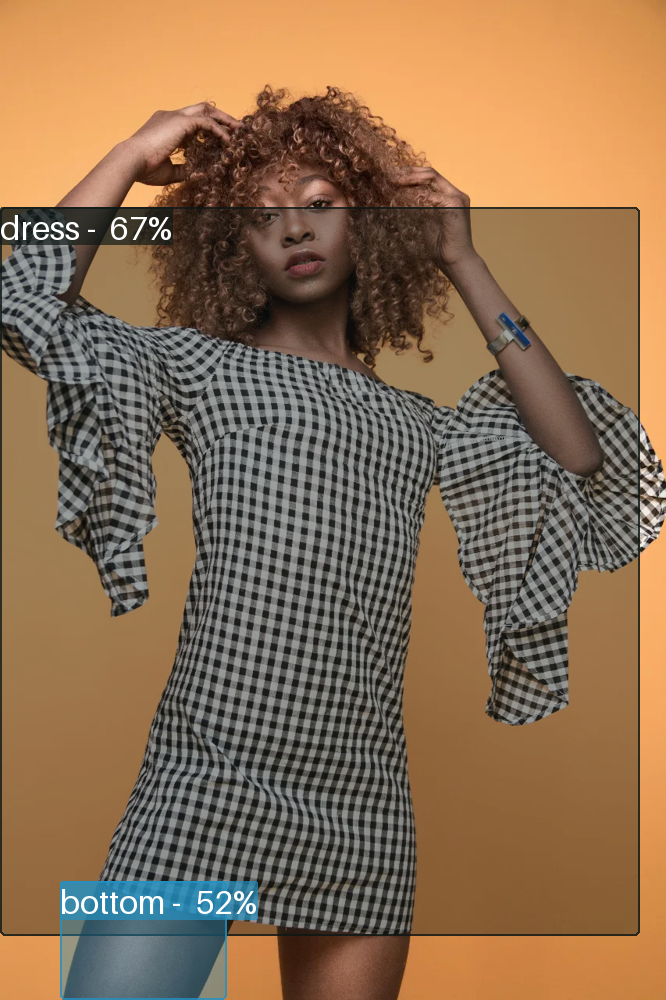

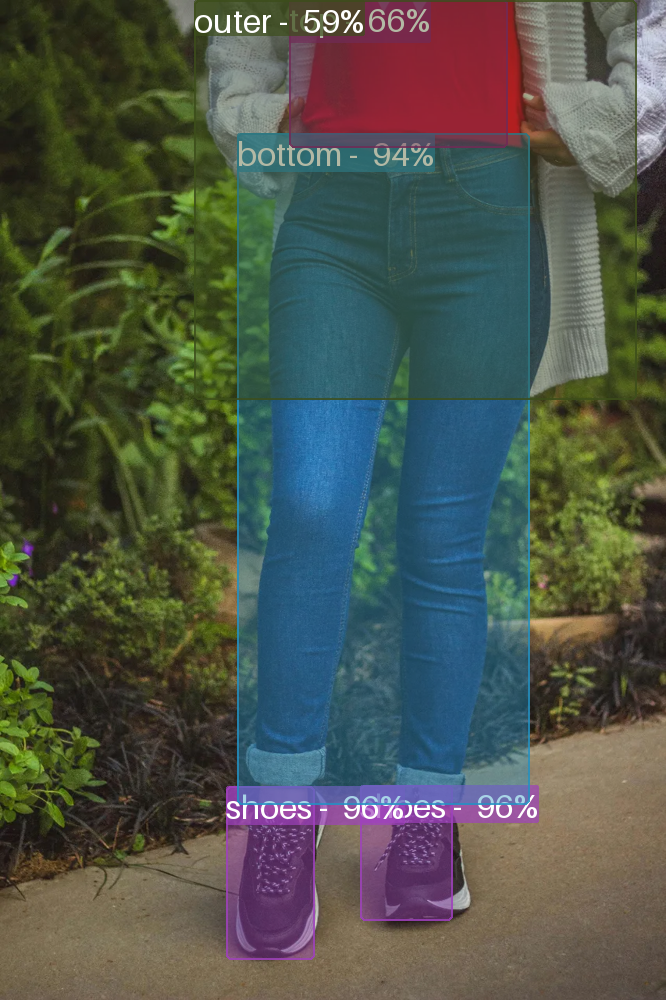

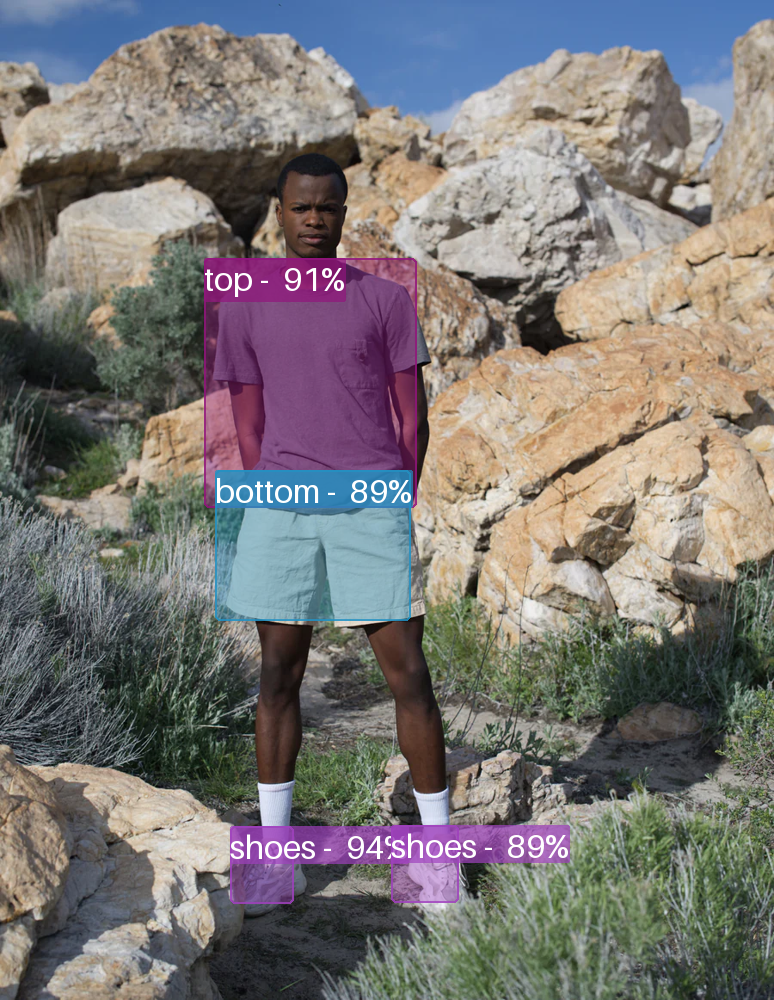

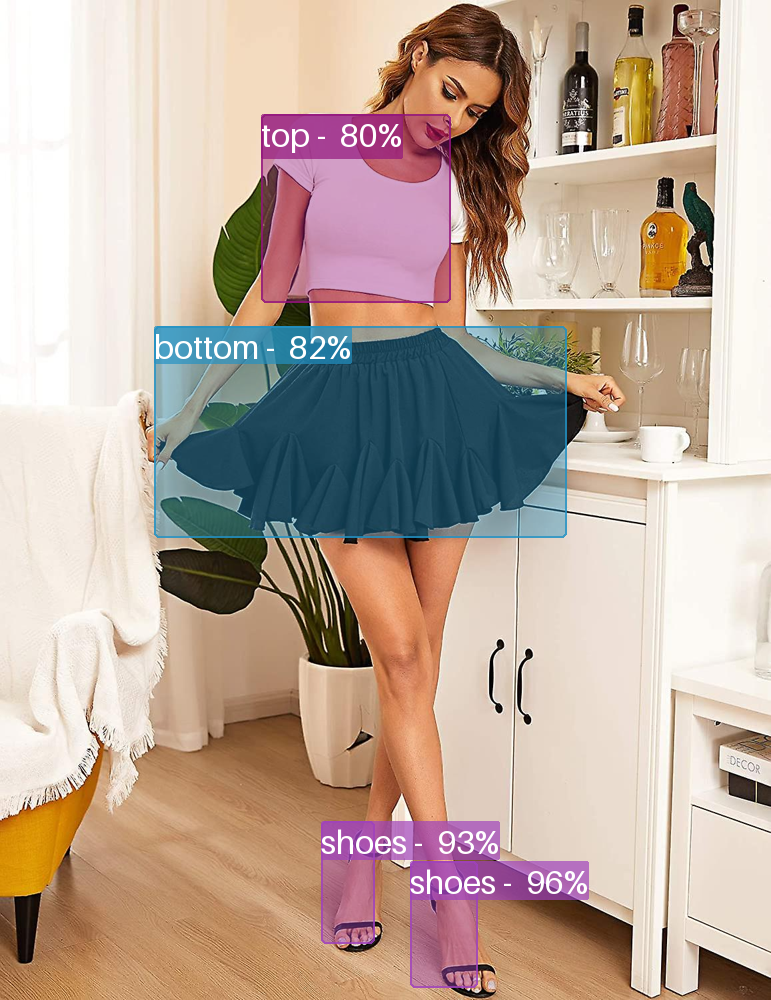

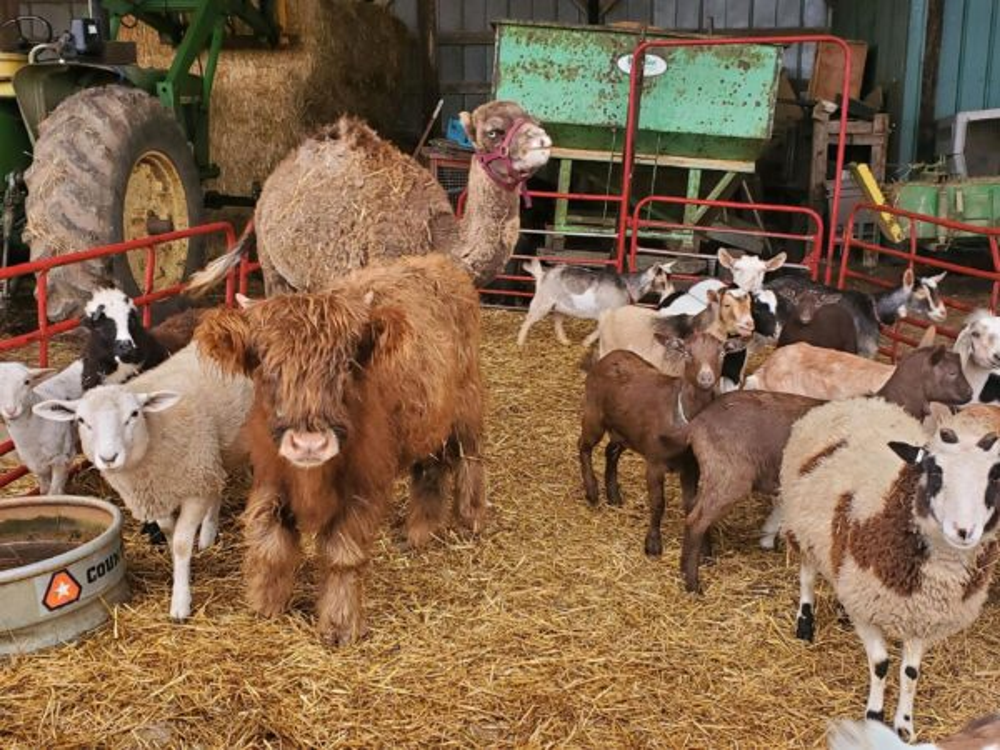

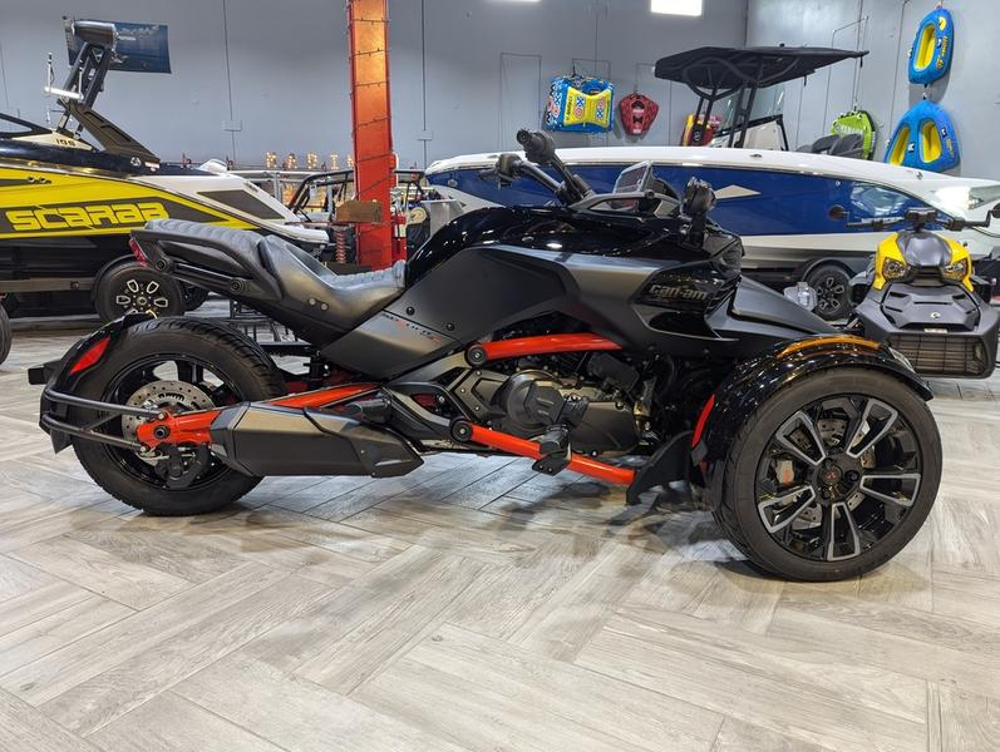

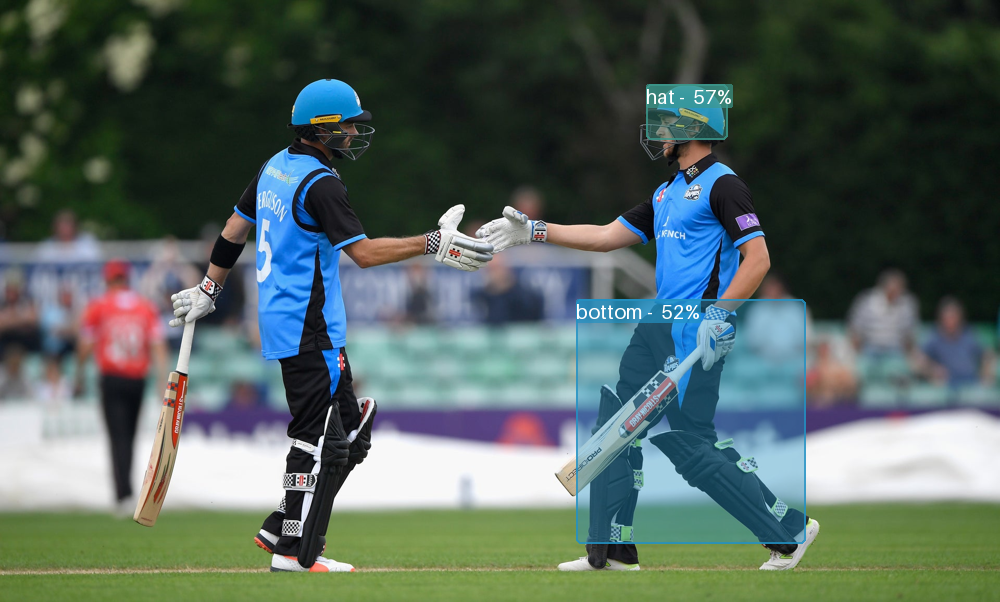

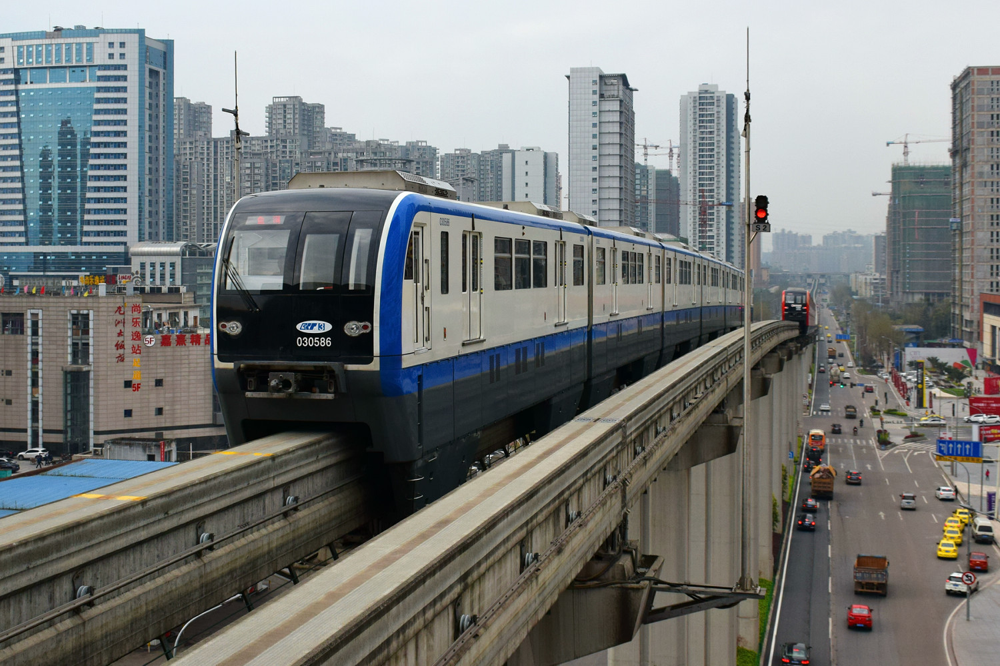

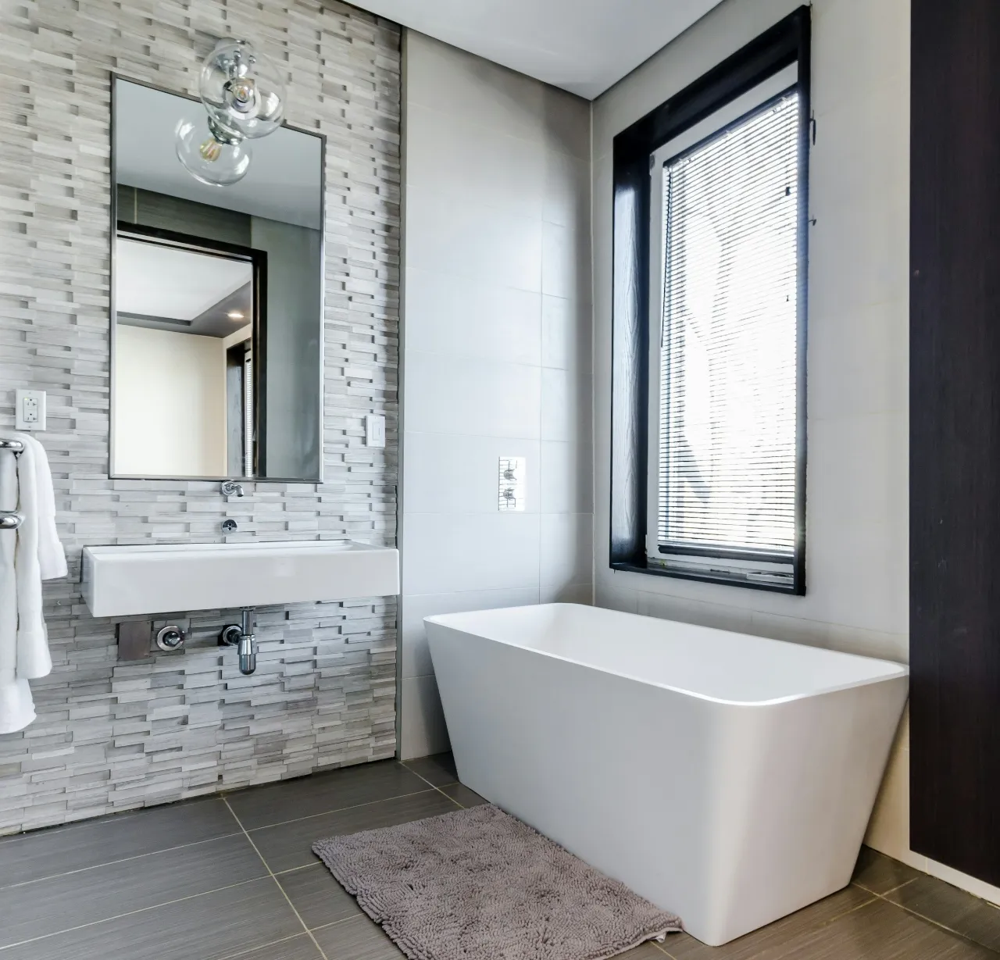

In [11]:
for model_result, image in zip(model_results, input_images):
    visualize_object_predictions(
        img=image,
        model_result=model_result,
        class_id_to_label=model.config.id2label,  # pyright: ignore
        display_result=True,
    )